# Intro

https://coolors.co/palette/f72585-b5179e-7209b7-560bad-480ca8-3a0ca3-3f37c9-4361ee-4895ef-4cc9f0

In [40]:
# Load libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import plotly.express as px
import plotly.io as pio
pio.templates.default = "simple_white"

# load full training set
df = pd.read_pickle(r"train_enc.pkl")

# Separate labels and target
X, y =  df.drop(columns="left", axis = 1), df["left"]

# Get variable names
bi_vars = [col for col in X.columns if X[col].nunique() == 2]
num_vars = [col for col in X.columns if (X[col].dtype in ["int8", "float32"]) & (col not in bi_vars)]
cat_vars = [col for col in X.columns if (col not in num_vars) & (col not in bi_vars)]

# Encode
#df.left = df.left.map({1:"Yes",0:"No"})
#df.bonus = df.bonus.map({1:"Yes",0:"No"})
#df.promoted = df.promoted.map({1:"Yes",0:"No"})


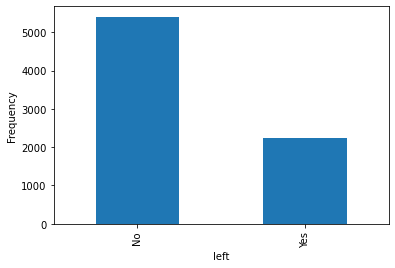

In [39]:
# Response variable
ax = (df.groupby('left')
            .size()
            .plot(kind='bar'))

ax.set_ylabel("Frequency");

## Probabilities

In [20]:
df.loc[df["left"]]["promoted"].mean()

0.0

In [19]:
# Calculate and print the unconditional probability of spam
p_left = df["left"].mean()
print(p_left)
# Calculate and print the unconditional probability of "!!!"
p_bonus = df["promoted"].mean()
print(p_bonus)

# Calculate and print the probability of "!!!" given spam
p_bonus_given_left= df.loc[df["left"]]["promoted"].mean()
print(p_bonus_given_left)

# Calculate and print the probability of spam given "!!!"
p_spam_given_bonus = p_bonus_given_left * p_left / p_bonus
print(p_spam_given_bonus)

0.29179769392033544
0.030791404612159328
0.0
0.0


In [ ]:
std_log_salary=lambda df: (df.log_salary - df.log_salary.mean()) / df.log_salary.std())

In [41]:
df.left = df.left.map({1:"Yes",0:"No"})
df.bonus = df.bonus.map({1:"Yes",0:"No"})
df.promoted = df.promoted.map({1:"Yes",0:"No"})

# Error for proportions
dep_agg = pd.DataFrame()
dep_agg["yes"] =df[(df["left"] == "Yes")].department.value_counts(sort=True)
dep_agg["no"] =df[(df["left"] == "No")].department.value_counts(sort=True)
dep_agg = dep_agg.rename_axis('department').reset_index()
dep_agg["perc_yes"] = dep_agg["yes"] / (dep_agg["yes"] + dep_agg["no"])
dep_agg["perc_no"] = dep_agg["no"] / (dep_agg["yes"] + dep_agg["no"])

In [46]:
def plot_p_helper(mean, low, high, rate, n_plays, names, league_mean=None, ax=None, **kwargs):
    if ax is None:
        ax = plt.gca()
    
    mean = mean.values
    rate = rate.values
    n_plays = n_plays.values
    names = names.values
    
    argsorted_ix = mean.argsort()
    interval = np.row_stack([low, high])
    
    plot_params(mean[argsorted_ix], interval[:, argsorted_ix], names[argsorted_ix],
                ax=ax, **kwargs)
    plot_p_params(rate[argsorted_ix], n_plays[argsorted_ix], league_mean,
                  ax=ax, **kwargs)

0.01320231772191245

In [48]:
dep_agg["std"] =  lambda dep_agg: ((dep_agg.perc_yes - dep_agg.perc_yes.mean())/ dep_agg.perc_yes.std())
dep_agg

,department,yes,no,perc_yes,perc_no,std
0,sales,440,1071,0.291198,0.708802,<function <lambda> at 0x00000225DFCA79D0>
1,retail,373,849,0.305237,0.694763,<function <lambda> at 0x00000225DFCA79D0>
2,operations,353,869,0.288871,0.711129,<function <lambda> at 0x00000225DFCA79D0>
3,engineering,349,864,0.287716,0.712284,<function <lambda> at 0x00000225DFCA79D0>
4,marketing,187,440,0.298246,0.701754,<function <lambda> at 0x00000225DFCA79D0>
5,support,165,430,0.277311,0.722689,<function <lambda> at 0x00000225DFCA79D0>
6,admin,101,239,0.297059,0.702941,<function <lambda> at 0x00000225DFCA79D0>
7,logistics,91,203,0.309524,0.690476,<function <lambda> at 0x00000225DFCA79D0>
8,finance,85,237,0.263975,0.736025,<function <lambda> at 0x00000225DFCA79D0>
9,IT,83,203,0.290210,0.709790,<function <lambda> at 0x00000225DFCA79D0>


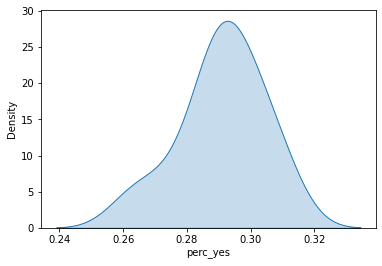

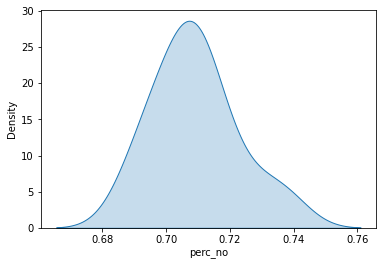

In [34]:
import seaborn as sns
# Plot the distribution of heads probability
sns.kdeplot(dep_agg["perc_yes"], shade=True, label="Attrition probabilty")
plt.show()

In [ ]:
biased_tosses = np.random.binomial(1, 0.05, size=1000)
heads_prob_biased = get_heads_prob(biased_tosses)
sns.kdeplot(heads_prob_biased, shade=True, label="biased coin")
plt.show()

The probability seems around the mean from the entire population.

## Discrete features


The values for projects are bettween 3 and 4 projects.

Tenure seems to have a normal distribution. So the most probable years of experience are in the range 5 to 8 years.

In [2]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go


fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Years of experience", "Number of projects"))

fig.add_trace(go.Histogram(x=df["tenure"],
    marker=dict(color='#4361ee'),
    opacity=0.75,
    histnorm="probability"),

row=1, col=1)

fig.add_trace(go.Histogram(x=df["projects"],
    marker=dict(color='#4361ee'),
    opacity=0.75,
    histnorm="probability"
),
row=1, col=2)

fig.update_layout(height=400, width=800,
                  title_text="Discrete distributions", showlegend=False)

fig.show()

## Binary features

In [3]:
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Has been promoted?", "Has earned a bonus?"))

fig.add_trace(go.Histogram(x=df["promoted"],
    marker=dict(color='#4361ee'),
    opacity=0.75
),
              row=1, col=1)

fig.add_trace(go.Histogram(x=df["bonus"],
    marker=dict(color='#4361ee'),
    opacity=0.75

),
              row=1, col=2)

fig.update_layout(height=400, width=800,
                  title_text="Binary distributions", showlegend=False)

fig.show()

## Continuous features

All features have almost a bell-shaped distribution.

In [4]:
df[["satisfaction","review","avg_hrs_month"]].describe().round(3)

,satisfaction,review,avg_hrs_month
count,7632.000,7632.000,7632.000
mean,0.505,0.652,184.644
std,0.158,0.086,4.159
min,0.000,0.310,172.281
25%,0.387,0.593,181.444
50%,0.501,0.647,184.635
75%,0.622,0.709,187.721
max,1.000,1.000,198.582


In [5]:
for var in ["satisfaction","review","avg_hrs_month"]:
    print(f"{var} median is ", round(df[var].median(),3))

satisfaction median is  0.501
review median is  0.647
avg_hrs_month median is  184.635


In [6]:
fig = make_subplots(
    rows=1, cols=3,
    subplot_titles=("Satisfaction", "Review", "Average working hours per month"))

fig.add_trace(go.Histogram(x=df["satisfaction"],
    nbinsx=18, 
    marker=dict(color='#4361ee'),
    opacity=0.75),
    row=1, col=1)

fig.add_trace(go.Histogram(x=df["review"],
    nbinsx=18, 
    marker=dict(color='#4361ee'),
    opacity=0.75),
    row=1, col=2)

fig.add_trace(go.Histogram(x=df["avg_hrs_month"],
    nbinsx=18, 
    marker=dict(color='#4361ee'),
    opacity=0.75),
    row=1, col=3)

fig.update_layout(height=350, width=900,
                  title_text="Continuous distributions", showlegend=False)

fig.show()

# Relationships with target 

## Continuous and target

In [7]:
import plotly.express as px

fig = px.histogram(df, x="satisfaction", color="left", marginal="box", width=800, nbins=60,color_discrete_sequence=["#f94144", "#bcd4e6"],
                         hover_data=df.columns)
fig.show()

In [8]:
import plotly.express as px

fig = px.histogram(df, x="review", color="left", marginal="box", width=800, nbins=60,color_discrete_sequence=["#f94144", "#bcd4e6"],
                         hover_data=df.columns)
fig.show()

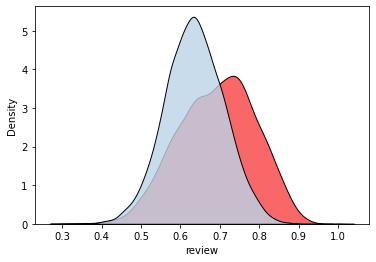

In [95]:
# Filter dataset to the year 2012
sns.kdeplot(df[df.left == "Yes"].review, 
            # Shade under kde and add a helpful label
            shade = True, multiple="stack",alpha=0.8,
            color=["#f94144"],
            label = '2012')

# Filter dataset to everything except the year 2012
sns.kdeplot(df[df.left == "No"].review, 
            # Again, shade under kde and add a helpful label           
            shade = True,multiple="stack",alpha=0.8,
            color=["#bcd4e6"],
            label = 'other years')
plt.show()

In [77]:
import plotly.figure_factory as ff
import numpy as np


hist_data = [df_yes.review.values, df_no.review.values]

group_labels = ['Group 1', 'Group 2']
colors = ["#f94144", "#bcd4e6"]

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot(hist_data, group_labels, colors=colors,
                         bin_size=.05, show_rug=False)

# Add title
fig.update_layout(title_text='Hist and Curve Plot')
fig.show()

NameError: name 'df_yes' is not defined

In [9]:
import plotly.express as px

fig = px.histogram(df, x="avg_hrs_month", color="left", marginal="box", width=800, nbins=60,color_discrete_sequence=["#f94144", "#bcd4e6"],
                         hover_data=df.columns)
fig.show()

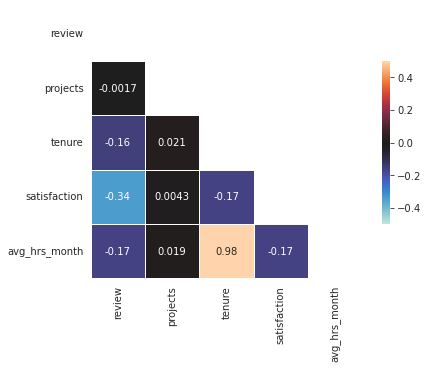

In [21]:
corr = X[num_vars].corr(method="spearman")

mask = np.zeros_like(corr)

mask[np.triu_indices_from(mask)] = True

with sns.axes_style("white"):

    f, ax = plt.subplots(figsize=(7, 5))

    ax = sns.heatmap(corr, mask=mask, vmax=.5, vmin=-.5, square=True,center=0,linewidths=.7, cbar_kws={"shrink": 0.6},annot=True)

In [73]:
import plotly.express as px

fig = px.scatter(df, x="review", y="satisfaction", color="left",trendline="ols", size='satisfaction',color_discrete_sequence=["#f94144", "#bcd4e6"])
fig.show()


fig = px.scatter(df, x="avg_hrs_month", y="satisfaction", color="left",trendline="ols", size='satisfaction',color_discrete_sequence=["#f94144", "#bcd4e6"])
fig.show()

fig = px.scatter(df, x="avg_hrs_month", y="review", color="left",trendline="ols", size='satisfaction',color_discrete_sequence=["#f94144", "#bcd4e6"])
fig.show()

In [ ]:
df["department"]

## Categorical and target

In [ ]:
department_df = df["department"]

In [11]:
fig = px.histogram(df, x="department",color="left",color_discrete_sequence=["#f94144", "#bcd4e6"])
fig.show()

In [12]:
fig = px.histogram(df, x="salary",color="left",color_discrete_sequence=["#f94144", "#bcd4e6"])
fig.show()

Fazer o intervalo, achando max e min.


In [104]:
import seaborn as sns

sns.set_theme(style="darkgrid")

tips = sns.load_dataset("tips")

tips[["time", "total_bill", "smoker"]]

,time,total_bill,smoker
0,Dinner,16.99,No
1,Dinner,10.34,No
2,Dinner,21.01,No
3,Dinner,23.68,No
4,Dinner,24.59,No
...,...,...,...
239,Dinner,29.03,No
240,Dinner,27.18,Yes
241,Dinner,22.67,Yes
242,Dinner,17.82,No


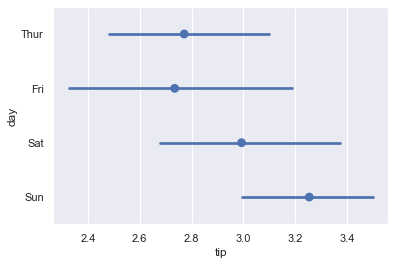

In [234]:
ax = sns.pointplot(x="tip", y="day", data=tips, join=False)

In [163]:
df["left"].value_counts(normalize=True)*100

No     70.820231
Yes    29.179769
Name: left, dtype: float64

In [282]:
df_test = df.groupby(['left', 'department']).size().unstack().T
df_test

left,No,Yes
department,,
IT,203,83
admin,239,101
engineering,864,349
finance,237,85
logistics,203,91
marketing,440,187
operations,869,353
retail,849,373
sales,1071,440


In [279]:
sns.set(style='ticks', context='talk')

ax = sns.pointplot('department', 'left', data=df_test, join=False, palette='Set2')
ax.set_ylim(0, 1)
sns.despine()

C:\ProgramData\Anaconda3\envs\env_full\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


ValueError: Could not interpret input 'department'

In [268]:
df

,department,promoted,review,projects,salary,tenure,satisfaction,bonus,avg_hrs_month,left
4408,sales,No,0.853635,4,medium,5,0.259219,No,180.178543,Yes
5368,retail,No,0.661567,4,medium,6,0.311056,No,183.607849,No
4920,retail,No,0.591863,3,low,7,0.277298,No,185.288177,No
8402,engineering,No,0.659410,3,medium,7,0.698308,No,187.385620,Yes
5617,retail,No,0.653639,2,medium,6,0.219496,No,183.541580,No
...,...,...,...,...,...,...,...,...,...,...
5111,operations,No,0.663666,4,medium,7,0.335153,No,184.728790,No
982,support,No,0.611830,3,low,3,0.653185,No,175.232635,No
8201,engineering,No,0.696824,3,medium,8,0.611014,Yes,188.192963,Yes
3347,operations,No,0.687078,4,medium,4,0.782508,No,178.361145,No


In [270]:
plot_data = (pd.concat(
    [pd.get_dummies(df['department'], prefix='department', prefix_sep=''),
        df['left']], axis=1)
    .corr()
    .loc['left', "department":]
    .to_frame()
    .T)

ValueError: No axis named 9 for object type DataFrame

In [250]:
dep_agg = pd.DataFrame()
dep_agg["yes"] =df[(df["left"] == "Yes")].department.value_counts(sort=True)
dep_agg["no"] =df[(df["left"] == "No")].department.value_counts(sort=True)
dep_agg["yes"] = dep_agg["yes"] / (dep_agg["yes"] + dep_agg["no"])
dep_agg["no"] = dep_agg["no"] / (dep_agg["yes"] + dep_agg["no"])
dep_agg=dep_agg.reset_index()

dep_agg=dep_agg.melt(id_vars=['index'])
dep_agg

,index,variable,value
0,sales,yes,0.291198
1,retail,yes,0.305237
2,operations,yes,0.288871
3,engineering,yes,0.287716
4,marketing,yes,0.298246
5,support,yes,0.277311
6,admin,yes,0.297059
7,logistics,yes,0.309524
8,finance,yes,0.263975
9,IT,yes,0.290210


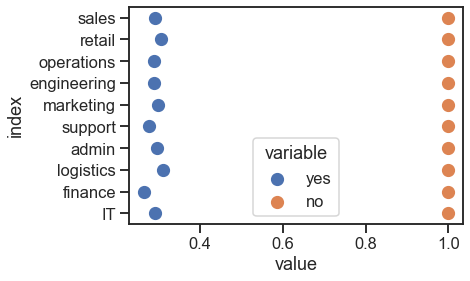

In [273]:
ax = sns.pointplot(x="value", y="index",hue="variable", join=False, capsize=.2, ci="sd", data=dep_agg,kind='point')

### Error


In [72]:
df.left.value_counts(normalize=True)

No     0.708202
Yes    0.291798
Name: left, dtype: float64

In [74]:
binom.pmf(x, n, p)

array([0.00067976, 0.00072079, 0.00076379, 0.00080884, 0.00085598,
       0.00090528, 0.0009568 , 0.0010106 , 0.00106673, 0.00112525,
       0.00118621, 0.00124966, 0.00131565, 0.00138423, 0.00145544,
       0.00152932, 0.00160592, 0.00168525, 0.00176737, 0.00185229,
       0.00194003, 0.00203061, 0.00212405, 0.00222036, 0.00231953,
       0.00242157, 0.00252647, 0.00263421, 0.00274477, 0.00285813,
       0.00297425, 0.0030931 , 0.00321462, 0.00333876, 0.00346547,
       0.00359466, 0.00372628, 0.00386023, 0.00399642, 0.00413475,
       0.00427513, 0.00441743, 0.00456153, 0.00470731, 0.00485462,
       0.00500334, 0.0051533 , 0.00530434, 0.00545632, 0.00560905,
       0.00576235, 0.00591605, 0.00606996, 0.00622389, 0.00637763,
       0.00653099, 0.00668375, 0.00683571, 0.00698665, 0.00713636,
       0.00728461, 0.00743119, 0.00757588, 0.00771845, 0.00785868,
       0.00799635, 0.00813124, 0.00826313, 0.00839179, 0.00851703,
       0.00863863, 0.00875637, 0.00887006, 0.00897951, 0.00908

In [75]:
p

0.291798

In [78]:
from scipy.stats import beta
import numpy as np

distribution=beta.pdf(x, a, b)
def quantile(x,quantiles):
    xsorted = sorted(x)
    qvalues = [xsorted[int(q * len(xsorted))] for q in quantiles]
    return zip(quantiles,qvalues)
quantiles = quantile(distribution,[0.05,0.16,.5,.84, 0.95])

In [52]:
dep_agg = pd.DataFrame()
dep_agg["yes"] =df[(df["left"] == "Yes")].department.value_counts(sort=True)
dep_agg["no"] =df[(df["left"] == "No")].department.value_counts(sort=True)
dep_agg["perc_yes"] = dep_agg["yes"] / (dep_agg["yes"] + dep_agg["no"])
dep_agg_y = dep_agg[["perc_yes"]]
dep_agg_y

,perc_yes
sales,0.291198
retail,0.305237
operations,0.288871
engineering,0.287716
marketing,0.298246
support,0.277311
admin,0.297059
logistics,0.309524
finance,0.263975
IT,0.290210


In [87]:
dep_agg_y = dep_agg_y.reset_index()

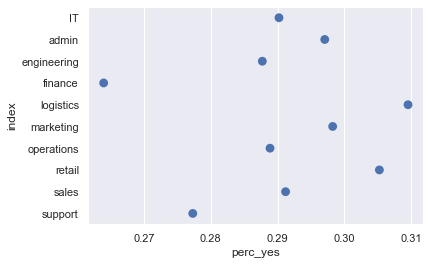

In [98]:
dep_agg_y["index"] = dep_agg_y["index"].astype("category")

ax = sns.pointplot(x="perc_yes", y="index",join=False, capsize=.2,ci="sd", data=dep_agg_y)

In [85]:
tips.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244 entries, 0 to 243
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   total_bill  244 non-null    float64 
 1   tip         244 non-null    float64 
 2   sex         244 non-null    category
 3   smoker      244 non-null    category
 4   day         244 non-null    category
 5   time        244 non-null    category
 6   size        244 non-null    int64   
dtypes: category(4), float64(2), int64(1)
memory usage: 7.4 KB


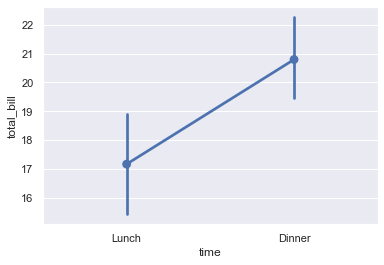

In [82]:
import seaborn as sns

sns.set_theme(style="darkgrid")

tips = sns.load_dataset("tips")

ax = sns.pointplot(x="time", y="total_bill", data=tips)

In [731]:
# Error for proportions
dep_agg = pd.DataFrame()
dep_agg["yes"] =df[(df["left"] == "Yes")].department.value_counts(sort=True)
dep_agg["no"] =df[(df["left"] == "No")].department.value_counts(sort=True)
dep_agg = dep_agg.rename_axis('department').reset_index()

In [732]:
dep_agg["perc_yes"] = dep_agg["yes"] / (dep_agg["yes"] + dep_agg["no"])
dep_agg["perc_no"] = dep_agg["no"] / (dep_agg["yes"] + dep_agg["no"])

In [744]:
import scipy.stats as sp
dep_agg_mean = dep_agg[["department", "perc_yes"]]
dep_agg_mean.groupby("department")["perc_yes"].agg([ "mean","std"])

,mean,std
department,,
IT,0.290210,NaN
admin,0.297059,NaN
engineering,0.287716,NaN
finance,0.263975,NaN
logistics,0.309524,NaN
marketing,0.298246,NaN
operations,0.288871,NaN
retail,0.305237,NaN
sales,0.291198,NaN


In [ ]:
dep_agg['lower'] = dep_agg['perc_yes'] - 1.96*dep_agg['std_err']
dep_agg['upper'] = dep_agg['perc_yes'] + 1.96*dep_agg['std_err']

In [674]:
# Population mean
mean = sum(dep_agg["yes"]) / len(df["department"])
# Compute the variance and print the std of the list
variance = sum(pow(x - mean, 2) for x in nums) / len(nums)
std = math.sqrt(variance)
print(std)

0.29093464243904404

In [704]:
dep_agg2 = dep_agg[["department", "perc_yes"]]
dep_agg2

,department,perc_yes
0,sales,0.291198
1,retail,0.305237
2,operations,0.288871
3,engineering,0.287716
4,marketing,0.298246
5,support,0.277311
6,admin,0.297059
7,logistics,0.309524
8,finance,0.263975
9,IT,0.290210


In [705]:
dep_agg2.describe()

,perc_yes
count,10.000000
mean,0.290935
std,0.013202
min,0.263975
25%,0.288005
50%,0.290704
75%,0.297949
max,0.309524


In [614]:
# Compute perc_yes mean and std
mean_perc_yes = np.mean(dep_agg.perc_yes)
std_perc_yes = np.std(dep_agg.perc_yes)
p025 = dep_agg['perc_yes'].quantile(0.025)
p975 = dep_agg['perc_yes'].quantile(0.975)

In [670]:
# Construct CI bounds for averages
dep_agg['lower'] = dep_agg['perc_yes'] - 1.96*dep_agg['std_err']
dep_agg['upper'] = dep_agg['perc_yes'] + 1.96*dep_agg['std_err']

# Setup a grid of plots, with non-shared x axes limits
g = sns.FacetGrid(average_ests, row = 'pollutant', sharex = False)

# Plot CI for average estimate
g.map(plt.hlines, 'y', 'lower', 'upper')

# Plot observed values for comparison and remove axes labels
g.map(plt.scatter, 'seen', 'y', color = 'orangered').set_ylabels('').set_xlabels('')

plt.show()

NameError: name 'perc_yes' is not defined

In [ ]:
# Set start and ends according to intervals 
# Make lines thicker and transparent
plt.hlines(y = 'year', xmin = 'lower', xmax = 'upper', 
           linewidth = 5, color = 'steelblue', alpha = 0.7,
           data = diffs_by_year)
# Point estimates
plt.plot('mean', 'year', 'k|', data = diffs_by_year)

# Add a 'null' reference line at 0 and color orangered
plt.axvline(x = 0, color = 'orangered', linestyle = '--')

# Set descriptive axis labels and title
plt.xlabel('95% CI')
plt.title('Avg SO2 differences between Cincinnati and Indianapolis')
plt.show()

In [ ]:
# Compute the standard error and margin of error
std_err = sem(df.department)
margin_error = std_err * z_score

# Compute and print the lower threshold
lower = sample_mean - margin_error
print(lower)

# Compute and print the upper threshold
upper = sample_mean + margin_error
print(upper)

In [679]:
import scipy.stats as st
from sm.stats.proportion import proportion

# CI for the mean
st.t.interval(0.95, len(dep_agg.perc_yes)-1, loc=mean_perc_yes, scale= std_perc_yes)

(0.2626015349681937, 0.31926774990989437)

In [663]:
import statsmodels
statsmodels.stats.proportion.proportion_confint()

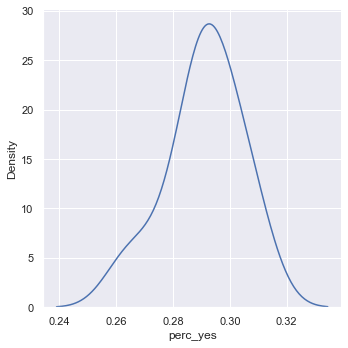

In [675]:
sns.displot(dep_agg, x="perc_yes", kind="kde")

In [665]:
# Probabilities distributions, BOTH ARE SKEWED
fig = px.histogram(dep_agg, x="perc_yes", width=800, nbins=6)
fig.show()
fig = px.histogram(dep_agg, x="perc_no", width=800, nbins=6)
fig.show()

In [606]:
import seaborn as sns

sns.set_theme(style="darkgrid")

tips = sns.load_dataset("tips")
tips

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


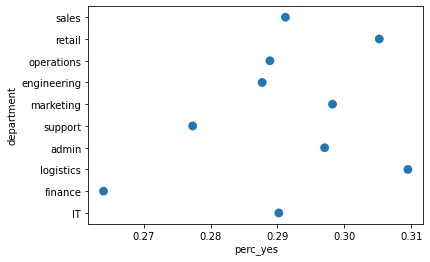

In [604]:
ax = sns.pointplot(x="perc_yes", y="department", data=dep_agg,join=False)

In [507]:
tips = sns.load_dataset("tips")
tips

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


ValueError: could not convert string to float: 'sales'

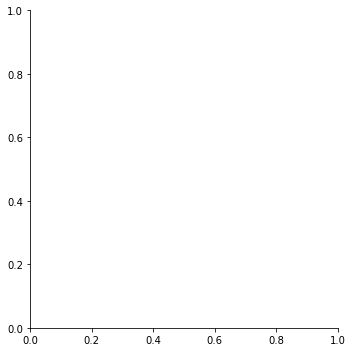

In [499]:
sns.pointplot(data=df_depp, x="index", y="percent_y", size="percent_y",legend=None,dodge=True)

In [433]:
df_department = pd.DataFrame(df.department.value_counts(sort=True))
df_department["yes"] = df[(df["left"] == "Yes")].department.value_counts(sort=True)
df_department["no"] =  df[(df["left"] == "No")].department.value_counts(sort=True)

df_department["percent_y"] = df_department["yes"] / df_department["department"]
df_department.reset_index()
yes_stats = df_department("index").agg([np.min, np.max, np.mean, np.std])

TypeError: 'DataFrame' object is not callable

In [348]:
# Subset for rows in South Atlantic or Mid-Atlantic regions
df_left = df[(df["left"] == "Yes")].department.value_counts()
df_left = df[(df["left"] == "No")].department.value_counts(normalize=True)


sales          1071
operations      869
engineering     864
retail          849
marketing       440
support         430
admin           239
finance         237
IT              203
logistics       203
Name: department, dtype: int64

In [343]:
# Count the number of churners and non-churners by State
print(df.groupby('department')['left'].value_counts())

department   left
IT           No       203
             Yes       83
admin        No       239
             Yes      101
engineering  No       864
             Yes      349
finance      No       237
             Yes       85
logistics    No       203
             Yes       91
marketing    No       440
             Yes      187
operations   No       869
             Yes      353
retail       No       849
             Yes      373
sales        No      1071
             Yes      440
support      No       430
             Yes      165
Name: left, dtype: int64


In [189]:
from scipy.stats import binom
binom.pmf(1, 100, 0.29)

5.45725843855193e-14

In [195]:
df['left'].value_counts(normalize=True)

No     0.708202
Yes    0.291798
Name: left, dtype: float64

In [176]:
(df_dep["No"] + df_dep["Yes"]).sum()

7632

In [248]:
df_dep = df.groupby(["left", "department"]).size().unstack().T
df_dep["percent_y"] = df_dep["Yes"] / (df_dep["No"] + df_dep["Yes"])
df_dep["percent_n"] = df_dep["No"] / (df_dep["No"] + df_dep["Yes"])


In [249]:
df_dep

left,No,Yes,percent_y,percent_n
department,,,,
IT,203,83,0.290210,0.709790
admin,239,101,0.297059,0.702941
engineering,864,349,0.287716,0.712284
finance,237,85,0.263975,0.736025
logistics,203,91,0.309524,0.690476
marketing,440,187,0.298246,0.701754
operations,869,353,0.288871,0.711129
retail,849,373,0.305237,0.694763
sales,1071,440,0.291198,0.708802


In [482]:
sns.scatterplot(data=df_dep, x="left", y="percent_y")

ValueError: Could not interpret value `left` for parameter `x`

In [201]:
len(np.histogram_bin_edges(df_dep.percent_y, bins="sturges"))

6

In [212]:
fig = px.histogram(df_dep, x="percent_y", width=800, nbins=6)
fig.show()

In [ ]:
# Construct CI bounds for averages
df_dep['lower'] = df_dep['percent_y'] - 1.96*df_dep['std_err']
df_dep['upper'] = df_dep['percent_y'] + 1.96*df_dep['std_err']

# Setup a grid of plots, with non-shared x axes limits
g = sns.FacetGrid(df_dep, row = 'pollutant', sharex = False)

# Plot CI for average estimate
g.map(plt.hlines, 'y', 'lower', 'upper')

# Plot observed values for comparison and remove axes labels
g.map(plt.scatter, 'seen', 'y', color = 'orangered').set_ylabels('').set_xlabels('')

plt.show()

In [14]:
data_dict = {}
data_dict['category'] = ['category 1','category 2','category 3']
data_dict['lower'] = [0.1,0.2,0.15]
data_dict['upper'] = [0.22,0.3,0.21]
dataset = pd.DataFrame(data_dict)
dataset

,category,lower,upper
0,category 1,0.10,0.22
1,category 2,0.20,0.30
2,category 3,0.15,0.21


In [ ]:
df["department"]

C:\Users\Eric\AppData\Local\Temp/ipykernel_1060/773013388.py:2: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "ro-" (-> color='r'). The keyword argument will take precedence.



([<matplotlib.axis.YTick at 0x21b4c519160>,
 [Text(0, 0, 'category 1'),
  Text(0, 1, 'category 2'),
  Text(0, 2, 'category 3')])

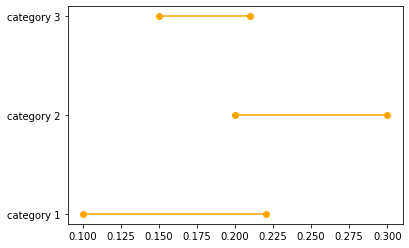

In [15]:
for lower,upper,y in zip(dataset['lower'],dataset['upper'],range(len(dataset))):
    plt.plot((lower,upper),(y,y),'ro-',color='orange')
plt.yticks(range(len(dataset)),list(dataset['category']))